<a href="https://colab.research.google.com/github/Tan-witya/stat/blob/AI-hackathon/Project1001.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [85]:
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster
import pandas as pd
from matplotlib import font_manager
import requests
import random
from sklearn.cluster import DBSCAN
import matplotlib.cm as cm
import matplotlib.colors as colors

In [86]:
# Read a sample CSV file
file_path = '/content/S2B_20260105_R061_T47PQR.shp'
df = gpd.read_file(file_path)

# Display the head of the DataFrame
print(f"Data from {file_path}:")
print(df.head())

Data from /content/S2B_20260105_R061_T47PQR.shp:
   BURN   BURNDate ModelVer  Shape_Area  \
0     1 2026-01-05    3.011         0.0   
1     1 2026-01-05    3.011         0.0   
2     1 2026-01-05    3.011         0.0   
3     1 2026-01-05    3.011         0.0   
4     1 2026-01-05    3.011         0.0   

                                            geometry  
0  POLYGON ((101.3535 13.47842, 101.35316 13.4779...  
1  POLYGON ((101.72949 13.4945, 101.72934 13.4943...  
2  POLYGON ((101.86122 13.50665, 101.86123 13.503...  
3  POLYGON ((101.58949 13.51783, 101.59041 13.517...  
4  POLYGON ((101.54306 13.54466, 101.54305 13.543...  


In [87]:
new_file_path = '/content/S2C_20260406_R004_T47QMA.shp'
df_new = gpd.read_file(new_file_path)

print(f"Data from {new_file_path}:")
print(df_new.head())

Data from /content/S2C_20260406_R004_T47QMA.shp:
   BURN   BURNDate  Shape_Leng  Shape_Area ModelVer  \
0     1 2026-04-06    0.939693    0.013896    3.011   
1     1 2026-04-06    0.939693    0.013896    3.011   
2     1 2026-04-06    0.939693    0.013896    3.011   
3     1 2026-04-06    0.939693    0.013896    3.011   
4     1 2026-04-06    0.939693    0.013896    3.011   

                                            geometry  
0  POLYGON ((98.22808 18.04234, 98.22808 18.04216...  
1  POLYGON ((98.10374 18.04285, 98.10375 18.04249...  
2  POLYGON ((98.10679 18.0425, 98.10641 18.0425, ...  
3  POLYGON ((98.18462 18.04342, 98.18462 18.04324...  
4  POLYGON ((98.10526 18.04359, 98.10526 18.0434,...  


<Axes: >

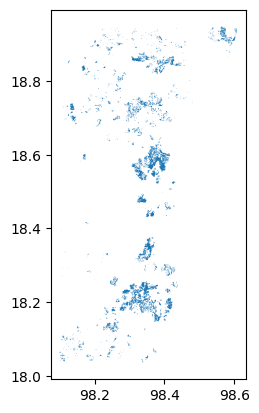

In [88]:
df_new.plot()

In [89]:
for col in df_new.select_dtypes(include=['datetime64']).columns:
    df_new[col] = df_new[col].astype(str)

center = df_new.union_all().centroid
m = folium.Map(location=[center.y, center.x], zoom_start=10)

# Define a style function to set the color to red
def style_function(feature):
    return {
        'fillColor': '#FF0000',
        'color': '#FF0000',
        'weight': 1,
        'fillOpacity': 0.7
    }

folium.GeoJson(df_new, style_function=style_function).add_to(m)
display(m)

In [90]:
df_new.tail()

,BURN,BURNDate,Shape_Leng,Shape_Area,ModelVer,geometry
2327,1,2026-04-06,0.939693,0.013896,3.011,"POLYGON ((98.54122 18.94549, 98.54122 18.94476..."
2328,1,2026-04-06,0.939693,0.013896,3.011,"POLYGON ((98.25973 18.94549, 98.25973 18.94531..."
2329,1,2026-04-06,0.939693,0.013896,3.011,"POLYGON ((98.49869 18.94575, 98.4987 18.94503,..."
2330,1,2026-04-06,0.939693,0.013896,3.011,"POLYGON ((98.53797 18.94585, 98.53778 18.94585..."
2331,1,2026-04-06,0.939693,0.013896,3.011,"POLYGON ((98.57122 18.94365, 98.57122 18.94384..."


In [91]:
df_new.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2332 entries, 0 to 2331
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   BURN        2332 non-null   int32   
 1   BURNDate    2332 non-null   object  
 2   Shape_Leng  2332 non-null   float64 
 3   Shape_Area  2332 non-null   float64 
 4   ModelVer    2332 non-null   object  
 5   geometry    2332 non-null   geometry
dtypes: float64(2), geometry(1), int32(1), object(2)
memory usage: 100.3+ KB


### Proximity-based Classification using DBSCAN Clustering

To classify the areas that are 'nearest' to each other, we can use a clustering algorithm. DBSCAN (Density-Based Spatial Clustering of Applications with Noise) is suitable for this task as it can find arbitrarily shaped clusters and identify noise points.

Before applying DBSCAN, it's crucial to reproject the `geometry` column to a Projected Coordinate System (PCS) that allows for accurate distance calculations (e.g., meters). Since the coordinates appear to be in Southeast Asia (around 98-101°E and 13-18°N based on `df.head()` and `df_new.head()`), UTM Zone 47N (EPSG:32647) is an appropriate choice for this region.

In [92]:
from sklearn.cluster import DBSCAN
import matplotlib.cm as cm
import matplotlib.colors as colors


df_proj = df_new.to_crs(epsg=32647)


coords = np.array([[point.x, point.y] for point in df_proj.geometry.centroid])


db = DBSCAN(eps=500, min_samples=5).fit(coords)
df_new['cluster'] = db.labels_

n_clusters_ = len(set(df_new['cluster'])) - (1 if -1 in df_new['cluster'] else 0)
print(f"Estimated number of clusters: {n_clusters_}")
print(f"Cluster labels counts:\n{df_new['cluster'].value_counts()}")


for col in df_new.select_dtypes(include=['datetime64']).columns:
    df_new[col] = df_new[col].astype(str)


Estimated number of clusters: 90
Cluster labels counts:
cluster
-1     819
 42    192
 80     93
 19     78
 29     73
      ... 
 75      5
 84      5
 81      5
 86      5
 41      4
Name: count, Length: 90, dtype: int64


In [93]:
center_clustered = df_new.union_all().centroid
m_clustered = folium.Map(location=[center_clustered.y, center_clustered.x], zoom_start=10)
unique_clusters = df_new['cluster'].unique()

cluster_ids = sorted([c for c in unique_clusters if c != -1])

colors_list = [colors.to_hex(cm.get_cmap('tab10')(i % 10)) for i in range(len(cluster_ids))]
cluster_colors = {cluster_id: colors_list[i] for i, cluster_id in enumerate(cluster_ids)}
# No need to assign a color for -1 if we are removing it

for idx, row in df_new.iterrows():
    cluster_label = row['cluster']

    # Skip noise points (cluster_label == -1)
    if cluster_label == -1:
        continue

    centroid = row.geometry.centroid
    color = cluster_colors.get(cluster_label, '#808080')

    folium.CircleMarker(
        location=[centroid.y, centroid.x],
        radius=5,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        popup=f'Cluster: {cluster_label}'
    ).add_to(m_clustered)

display(m_clustered)

/tmp/ipykernel_3736/1079898534.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors_list = [colors.to_hex(cm.get_cmap('tab10')(i % 10)) for i in range(len(cluster_ids))]


In [94]:
df_proj['cluster'] = df_new['cluster']

cluster_centroids = df_proj[df_proj['cluster'] != -1].groupby('cluster').geometry.apply(lambda x: x.unary_union.centroid)


import random
random.seed(42)

valid_clusters_ids = list(cluster_centroids.index)
num_fire_clusters = min(3, len(valid_clusters_ids)) # Select 3 clusters, or fewer if not enough clusters exist
fire_clusters_ids = random.sample(valid_clusters_ids, num_fire_clusters)

print(f"Simulating fire in clusters: {fire_clusters_ids}\n")

fire_centroids_gdf = gpd.GeoDataFrame(
    geometry=[cluster_centroids[cid] for cid in fire_clusters_ids],
    crs=df_proj.crs
)

# 4. Calculate distances from all other non-'fire' clusters to the nearest 'fire' cluster
distances_to_nearest_fire = {}
for cluster_id, target_centroid in cluster_centroids.drop(fire_clusters_ids, errors='ignore').items():
    # Calculate distance from the current cluster's centroid to each 'fire' cluster centroid
    min_dist_to_fire = float('inf')
    for fire_centroid_geom in fire_centroids_gdf.geometry:
        dist = target_centroid.distance(fire_centroid_geom)
        if dist < min_dist_to_fire:
            min_dist_to_fire = dist
    distances_to_nearest_fire[cluster_id] = min_dist_to_fire

# Convert to a Pandas Series for easier handling and sorting
predicted_nearest_fire_clusters_df = pd.DataFrame.from_dict(
    distances_to_nearest_fire, orient='index', columns=['distance_to_nearest_fire_m']
)
predicted_nearest_fire_clusters_df.index.name = 'cluster'

# Sort by distance to identify the nearest ones
predicted_nearest_fire_clusters_df = predicted_nearest_fire_clusters_df.sort_values(by='distance_to_nearest_fire_m')

print("Clusters predicted to be nearest to the simulated fire zones (sorted by distance, in meters):")
display(predicted_nearest_fire_clusters_df.head(10)) # Display top 10 nearest clusters

/tmp/ipykernel_3736/3937155062.py:3: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  cluster_centroids = df_proj[df_proj['cluster'] != -1].groupby('cluster').geometry.apply(lambda x: x.unary_union.centroid)


Simulating fire in clusters: [81, 14, 3]

Clusters predicted to be nearest to the simulated fire zones (sorted by distance, in meters):


,distance_to_nearest_fire_m
cluster,
15,1083.527259
78,1143.877519
82,1420.754240
73,3416.924564
80,3681.798374
17,4605.303831
88,5400.137709
19,5989.324978
6,6165.778864


In [95]:
center_map_prediction = df_new.union_all().centroid
m_prediction = folium.Map(location=[center_map_prediction.y, center_map_prediction.x], zoom_start=10)

unique_clusters_all = df_proj['cluster'].unique()

# Prepare colors for all non-noise clusters
cluster_ids_all = sorted([c for c in unique_clusters_all if c != -1])
colors_list_all = [colors.to_hex(cm.get_cmap('tab10')(i % 10)) for i in range(len(cluster_ids_all))]
cluster_colors_map = {cluster_id: colors_list_all[i] for i, cluster_id in enumerate(cluster_ids_all)}

# Define special colors for 'on fire' and 'nearest' clusters
fire_cluster_color = '#FF0000' # Red
nearest_cluster_highlight_color = '#FFA500' # Orange

# Get the list of nearest clusters from the previous step's DataFrame index
nearest_clusters_ids = predicted_nearest_fire_clusters_df.index.tolist()

# Iterate through each cluster's centroid and add to map
for cluster_id, centroid_geom in cluster_centroids.items():
    if cluster_id in fire_clusters_ids:
        # Highlight 'on fire' clusters in red
        current_color = fire_cluster_color
        popup_text = f'ON FIRE Cluster: {cluster_id}'
    elif cluster_id in nearest_clusters_ids:
        # Highlight nearest predicted clusters in orange
        current_color = nearest_cluster_highlight_color
        distance = predicted_nearest_fire_clusters_df.loc[cluster_id, 'distance_to_nearest_fire_m']
        popup_text = f'Nearest Cluster: {cluster_id} ({distance:.2f} m)'
    else:
        # Other non-noise clusters keep their original color
        current_color = cluster_colors_map.get(cluster_id, '#D3D3D3') # Default light grey for others if not in map
        popup_text = f'Cluster: {cluster_id}'

    folium.CircleMarker(
        location=[centroid_geom.y, centroid_geom.x],
        radius=7 if cluster_id in fire_clusters_ids else 5, # Larger radius for fire clusters
        color=current_color,
        fill=True,
        fill_color=current_color,
        fill_opacity=0.8,
        popup=popup_text
    ).add_to(m_prediction)

display(m_prediction)

/tmp/ipykernel_3736/2881781786.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors_list_all = [colors.to_hex(cm.get_cmap('tab10')(i % 10)) for i in range(len(cluster_ids_all))]


In [96]:
df_proj['cluster'] = df_new['cluster']

cluster_centroids = df_proj[df_proj['cluster'] != -1].groupby('cluster').geometry.apply(lambda x: x.unary_union.centroid)



valid_clusters_ids = list(cluster_centroids.index)
num_fire_clusters = min(3, len(valid_clusters_ids))
fire_clusters_ids = get_random_clusters(df_new, num_fire_clusters)

print(f"Simulating fire in clusters: {fire_clusters_ids}\n")

fire_centroids_gdf = gpd.GeoDataFrame(
    geometry=[cluster_centroids[cid] for cid in fire_clusters_ids],
    crs=df_proj.crs
)


distances_to_nearest_fire = {}
for cluster_id, target_centroid in cluster_centroids.drop(fire_clusters_ids, errors='ignore').items():
    min_dist_to_fire = float('inf')
    for fire_centroid_geom in fire_centroids_gdf.geometry:
        dist = target_centroid.distance(fire_centroid_geom)
        if dist < min_dist_to_fire:
            min_dist_to_fire = dist
    distances_to_nearest_fire[cluster_id] = min_dist_to_fire


predicted_nearest_fire_clusters_df = pd.DataFrame.from_dict(
    distances_to_nearest_fire, orient='index', columns=['distance_to_nearest_fire_m']
)
predicted_nearest_fire_clusters_df.index.name = 'cluster'


predicted_nearest_fire_clusters_df = predicted_nearest_fire_clusters_df.sort_values(by='distance_to_nearest_fire_m')

print("Clusters predicted to be nearest to the simulated fire zones (sorted by distance, in meters):")
display(predicted_nearest_fire_clusters_df.head(10))


/tmp/ipykernel_3736/1930689428.py:3: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  cluster_centroids = df_proj[df_proj['cluster'] != -1].groupby('cluster').geometry.apply(lambda x: x.unary_union.centroid)


Simulating fire in clusters: [np.int64(35), np.int64(31), np.int64(28)]

Clusters predicted to be nearest to the simulated fire zones (sorted by distance, in meters):


,distance_to_nearest_fire_m
cluster,
37,929.911441
32,1446.358184
39,2348.140748
41,3388.692281
44,3742.892182
33,3790.941334
27,3791.802056
29,4203.178752
34,4482.523660


In [97]:
import random
center_map_prediction = df_new.union_all().centroid
m_prediction = folium.Map(location=[center_map_prediction.y, center_map_prediction.x], zoom_start=10)

unique_clusters_all = df_proj['cluster'].unique()


cluster_ids_all = sorted([c for c in unique_clusters_all if c != -1])
colors_list_all = [colors.to_hex(cm.get_cmap('tab10')(i % 10)) for i in range(len(cluster_ids_all))]
cluster_colors_map = {cluster_id: colors_list_all[i] for i, cluster_id in enumerate(cluster_ids_all)}

# Define special colors for 'on fire' and 'nearest' clusters
fire_cluster_color = '#FF0000' # Red
nearest_cluster_highlight_color = '#FFA500' # Orange

# Get the list of nearest clusters from the previous step's DataFrame index
nearest_clusters_ids = predicted_nearest_fire_clusters_df.index.tolist()


def style_function_polygon(feature):
    cluster_label = feature['properties']['cluster']
    if cluster_label == -1: # Hidden noise
        return {'fillColor': '#D3D3D3', 'color': '#D3D3D3', 'weight': 0, 'fillOpacity': 0}
    elif cluster_label in fire_clusters_ids:
        return {'fillColor': fire_cluster_color, 'color': fire_cluster_color, 'weight': 1, 'fillOpacity': 0.7}
    elif cluster_label in nearest_clusters_ids:
        return {'fillColor': nearest_cluster_highlight_color, 'color': nearest_cluster_highlight_color, 'weight': 1, 'fillOpacity': 0.7}
    else: # Hide other clusters
        return {'fillColor': '#D3D3D3', 'color': '#D3D3D3', 'weight': 0, 'fillOpacity': 0}

# Add GeoJson layers for the polygons to the map
folium.GeoJson(
    df_new[df_new['cluster'] != -1].to_json(), # Filter out noise points initially
    style_function=style_function_polygon,
    tooltip=folium.GeoJsonTooltip(fields=['cluster'], aliases=['Cluster:'])
).add_to(m_prediction)

display(m_prediction)

/tmp/ipykernel_3736/2978079430.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors_list_all = [colors.to_hex(cm.get_cmap('tab10')(i % 10)) for i in range(len(cluster_ids_all))]


In [98]:
import random

def get_random_clusters(gdf, num_clusters):

    # Get all unique cluster IDs, excluding noise points (-1)
    all_cluster_ids = [c for c in gdf['cluster'].unique() if c != -1]

    # Ensure we don't try to select more clusters than available
    num_clusters_to_select = min(num_clusters, len(all_cluster_ids))

    # Randomly sample the cluster IDs
    random_clusters = random.sample(all_cluster_ids, num_clusters_to_select)

    return random_clusters


# Demonstration of the function:
num_random = 5 # Let's select 5 random clusters
randomly_selected_clusters = get_random_clusters(df_new, num_random)
print(f"Randomly selected {num_random} clusters: {randomly_selected_clusters}")


Randomly selected 5 clusters: [np.int64(17), np.int64(13), np.int64(85), np.int64(69), np.int64(11)]


## Consolidated Fire Simulation and Visualization Function

Below is a consolidated function `simulate_fire_and_visualize` that combines the following steps:

1.  **DBSCAN Clustering**: Identifies spatial clusters based on proximity.
2.  **Reprojection**: Ensures accurate distance calculations by reprojecting to a suitable UTM coordinate system.
3.  **Random Fire Selection**: Randomly selects a specified number of clusters to simulate as 'on fire'.
4.  **Proximity Calculation**: Determines the distance from all other clusters to the nearest 'on fire' cluster.
5.  **Map Visualization**: Generates an interactive Folium map, highlighting 'on fire' clusters in red and the nearest predicted clusters in orange, centered on one of the fire clusters.

In [99]:
def simulate_fire_and_visualize(gdf_original, num_fire_clusters=3, num_nearest_to_show=10, eps_dbscan=500, min_samples_dbscan=5):

    gdf = gdf_original.copy()


    if gdf.crs != 'EPSG:32647':
        gdf_proj = gdf.to_crs(epsg=32647)
    else:
        gdf_proj = gdf


    coords = np.array([[point.x, point.y] for point in gdf_proj.geometry.centroid])
    db = DBSCAN(eps=eps_dbscan, min_samples=min_samples_dbscan).fit(coords)
    gdf['cluster'] = db.labels_
    gdf_proj['cluster'] = db.labels_


    cluster_centroids = gdf_proj[gdf_proj['cluster'] != -1].groupby('cluster').geometry.apply(lambda x: x.union_all().centroid)


    valid_clusters_ids = list(cluster_centroids.index)
    if not valid_clusters_ids:
        print("No valid clusters found after DBSCAN. Cannot simulate fire.")

        return folium.Map(location=[gdf_original.geometry.centroid.y.mean(), gdf_original.geometry.centroid.x.mean()], zoom_start=8)


    num_fire_clusters_actual = min(num_fire_clusters, len(valid_clusters_ids))
    fire_clusters_ids = random.sample(valid_clusters_ids, num_fire_clusters_actual)
    print(f"Simulating fire in clusters: {fire_clusters_ids}\n")


    fire_centroids_gdf = gpd.GeoDataFrame(
        geometry=[cluster_centroids[cid] for cid in fire_clusters_ids],
        crs=gdf_proj.crs
    )

    distances_to_nearest_fire = {}
    non_fire_cluster_ids = [cid for cid in valid_clusters_ids if cid not in fire_clusters_ids]

    for cluster_id in non_fire_cluster_ids:
        target_centroid = cluster_centroids[cluster_id]
        min_dist_to_fire = float('inf')
        for fire_centroid_geom in fire_centroids_gdf.geometry:
            dist = target_centroid.distance(fire_centroid_geom)
            if dist < min_dist_to_fire:
                min_dist_to_fire = dist
        distances_to_nearest_fire[cluster_id] = min_dist_to_fire

    # Convert distances to a DataFrame, sort, and select top 'num_nearest_to_show'
    predicted_nearest_fire_clusters_df = pd.DataFrame.from_dict(
        distances_to_nearest_fire, orient='index', columns=['distance_to_nearest_fire_m']
    )
    predicted_nearest_fire_clusters_df.index.name = 'cluster'
    predicted_nearest_fire_clusters_df = predicted_nearest_fire_clusters_df.sort_values(by='distance_to_nearest_fire_m').head(num_nearest_to_show)

    print(f"Top {num_nearest_to_show} clusters predicted to be nearest to the simulated fire zones:")
    display(predicted_nearest_fire_clusters_df)

    nearest_clusters_ids = predicted_nearest_fire_clusters_df.index.tolist()


    if fire_clusters_ids:
        first_fire_cluster_centroid_proj = cluster_centroids[fire_clusters_ids[0]]
        first_fire_cluster_centroid_latlon = gpd.GeoSeries(first_fire_cluster_centroid_proj, crs=gdf_proj.crs).to_crs(epsg=4326).iloc[0]
        map_center = [first_fire_cluster_centroid_latlon.y, first_fire_cluster_centroid_latlon.x]
    else:

        map_center = [gdf_original.geometry.centroid.y.mean(), gdf_original.geometry.centroid.x.mean()]

    m_simulation = folium.Map(location=map_center, zoom_start=10)


    fire_cluster_color = '#FF0000' # Red
    nearest_cluster_highlight_color = '#FFA500' # Orange

    # Style function for polygons: highlights fire/nearest clusters, hides others (including noise)
    def style_function_polygon(feature):
        cluster_label = feature['properties']['cluster']
        if cluster_label in fire_clusters_ids:
            return {'fillColor': fire_cluster_color, 'color': fire_cluster_color, 'weight': 1, 'fillOpacity': 0.7}
        elif cluster_label in nearest_clusters_ids:
            return {'fillColor': nearest_cluster_highlight_color, 'color': nearest_cluster_highlight_color, 'weight': 1, 'fillOpacity': 0.7}
        else:
            # Hide other clusters (cluster_label == -1 for noise, or other valid clusters not in fire/nearest)
            return {'fillColor': '#D3D3D3', 'color': '#D3D3D3', 'weight': 0, 'fillOpacity': 0} # Transparent

    # Filter gdf to only include fire and nearest clusters for plotting, excluding noise
    clusters_to_display = gdf[(gdf['cluster'].isin(fire_clusters_ids)) | (gdf['cluster'].isin(nearest_clusters_ids))]

    if not clusters_to_display.empty:
        folium.GeoJson(
            clusters_to_display.to_json(),
            style_function=style_function_polygon,
            tooltip=folium.GeoJsonTooltip(fields=['cluster'], aliases=['Cluster ID:'])
        ).add_to(m_simulation)

    return m_simulation


simulation_map = simulate_fire_and_visualize(gdf_original=df_new, num_fire_clusters=3, num_nearest_to_show=5)
display(simulation_map)

Simulating fire in clusters: [75, 54, 4]

Top 5 clusters predicted to be nearest to the simulated fire zones:


,distance_to_nearest_fire_m
cluster,
72,2345.634132
48,2742.807408
49,3061.798125
57,3124.360247
71,3140.059213
